### Листинг 1. Базовые морфологические операции


In [1]:
import imutils
import cv2
import skimage.color
import skimage.segmentation
import skimage.measure
import skimage.feature
import skimage.morphology
import scipy.ndimage
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
import warnings
warnings.filterwarnings('ignore')
export_parallel = True
use_graph = True

In [2]:
# Исходное изображение
image = cv2.imread("oranges.png")

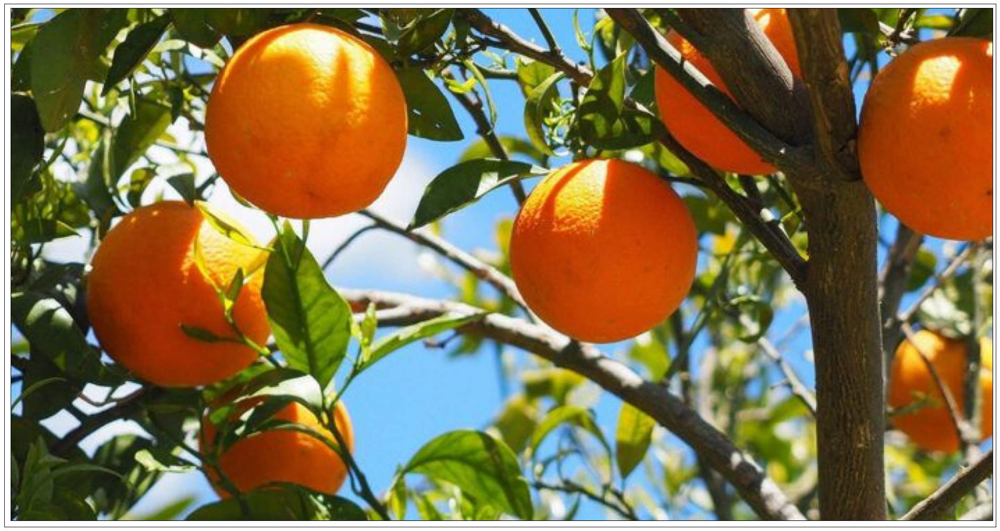

In [3]:
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

In [4]:
# Перевод в пространство HSV
image = cv2.cvtColor(np.float32(image / 255.0), cv2.COLOR_BGR2HSV)

# Фильтрация по Гауссу
image = cv2.GaussianBlur(image, (5, 5), 1)

# Создание маски
image_mask = np.logical_and(
    np.logical_or(image[:,:,0] < 50.0, image[:,:,0] > 345.0), # Hue < 50 or Hue > 345
    np.logical_and(
        image[:,:,1] > 0.4, # Saturation > 0.3
        image[:,:,2] > 0.4, # Lightness > 0.25
    )
)

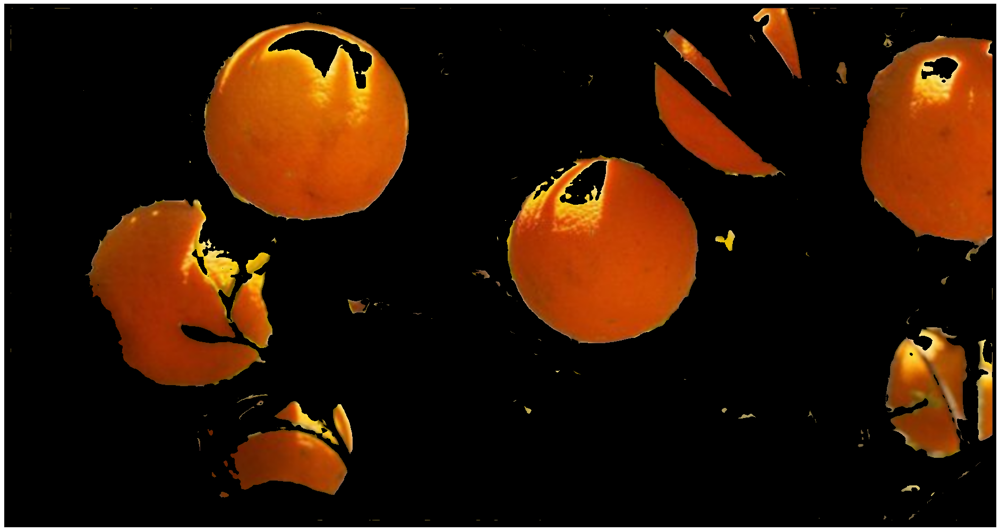

In [5]:
# Результат до морфологической фильтрации
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(cv2.bitwise_and(image, image, mask=np.uint8(image_mask * 255)), cv2.COLOR_HSV2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

In [6]:
# Открытие
selem = skimage.morphology.disk(7)
image_mask = skimage.morphology.erosion(image_mask, selem)
image_mask = skimage.morphology.dilation(image_mask, selem)

# Закрытие
selem = skimage.morphology.disk(11)
image_mask = skimage.morphology.dilation(image_mask, selem)
image_mask = skimage.morphology.erosion(image_mask, selem)


image_mask = skimage.morphology.convex_hull_object(image_mask)

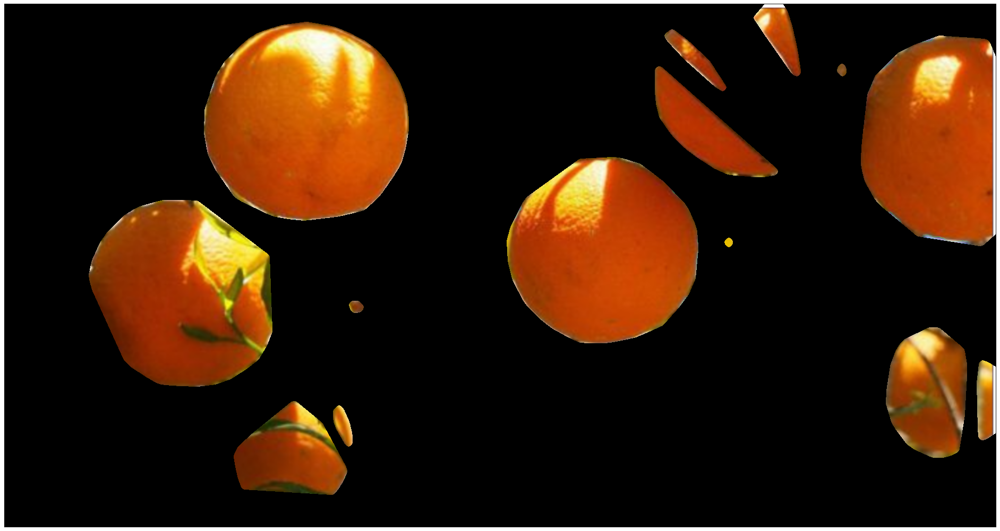

In [7]:
# Результат после морфологической фильтрации
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    image_to_show = cv2.bitwise_and(image, image, mask=np.uint8(image_mask * 255))
    plt.imshow(cv2.cvtColor(image_to_show, cv2.COLOR_HSV2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

### Листинг 2. Разделение «склеенных» объектов


In [37]:
# Исходное изображение
image = cv2.imread("coins.png")

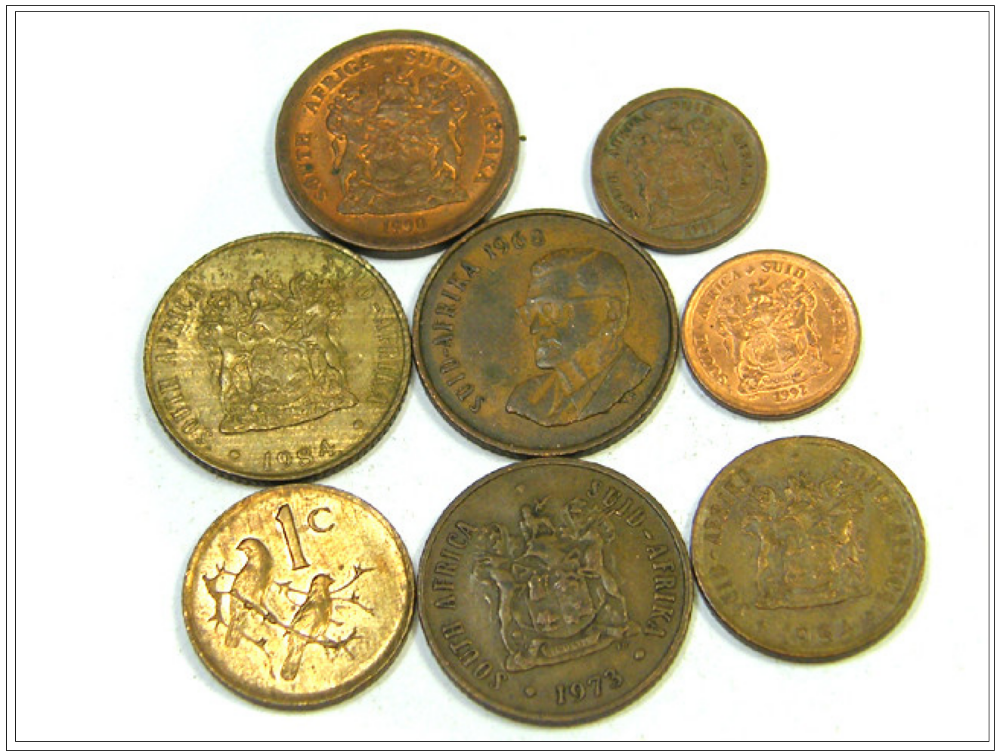

In [38]:
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

In [39]:
# Перевод в пространство HSV
image = cv2.cvtColor(np.float32(image / 255.0), cv2.COLOR_BGR2HSV)

# Создание маски
image_mask = image[:,:,1] > 0.15 # Saturation > 0.1

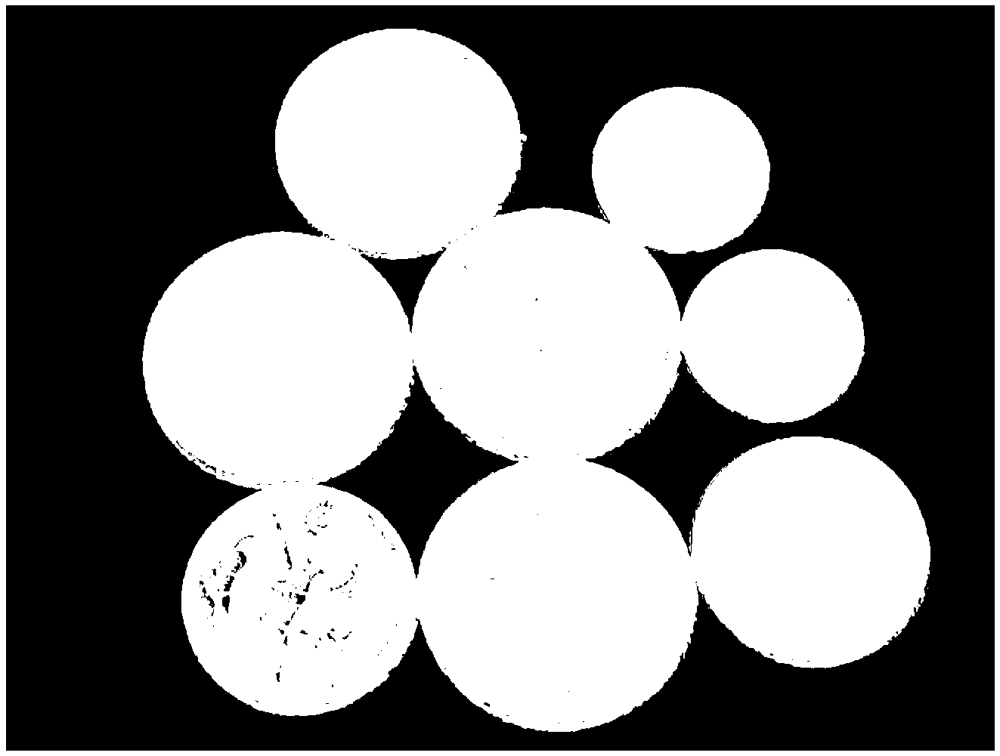

In [40]:
# Вид маски до морфологической фильтрации
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(np.uint8(image_mask * 255), cv2.COLOR_GRAY2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

In [44]:
# Слабое закрытие (замыкание)
selem = skimage.morphology.disk(8)
image_mask = skimage.morphology.dilation(image_mask, selem)
image_mask = skimage.morphology.erosion(image_mask, selem)

expanded = image_mask.copy()

# Многократное сжатие
selem = skimage.morphology.disk(10)
for i in range(7):
    expanded = skimage.morphology.erosion(expanded, selem)

# Расширение до пересечения через дополнительный массив, чтобы края изображения не портили результат.
if use_graph:
    size=np.array(expanded.shape)
    expanded_huge = np.zeros(shape=size * 3, dtype=np.bool)
    expanded_huge[size[0]:2*size[0], size[1]:2*size[1]] = expanded
    expanded = expanded_huge
    expanded_huge = np.logical_not(expanded_huge)
    expanded_huge = skimage.morphology.thin(expanded_huge)
    expanded_huge = np.logical_not(expanded_huge)
    expanded = expanded_huge[size[0]:2*size[0], size[1]:2*size[1]]
    image_mask = np.logical_and(image_mask, expanded)

# Слабая эрозия
selem = skimage.morphology.disk(8)
image_mask = skimage.morphology.erosion(image_mask, selem)

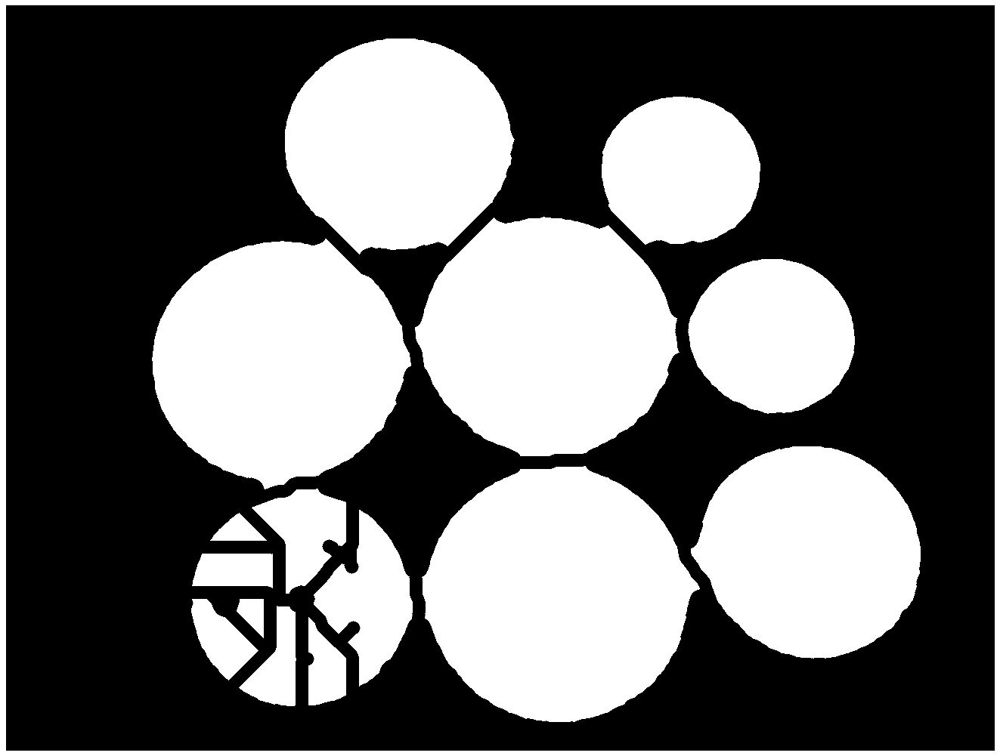

In [45]:
# Вид маски после морфологической фильтрации
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(np.uint8(image_mask * 255), cv2.COLOR_GRAY2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


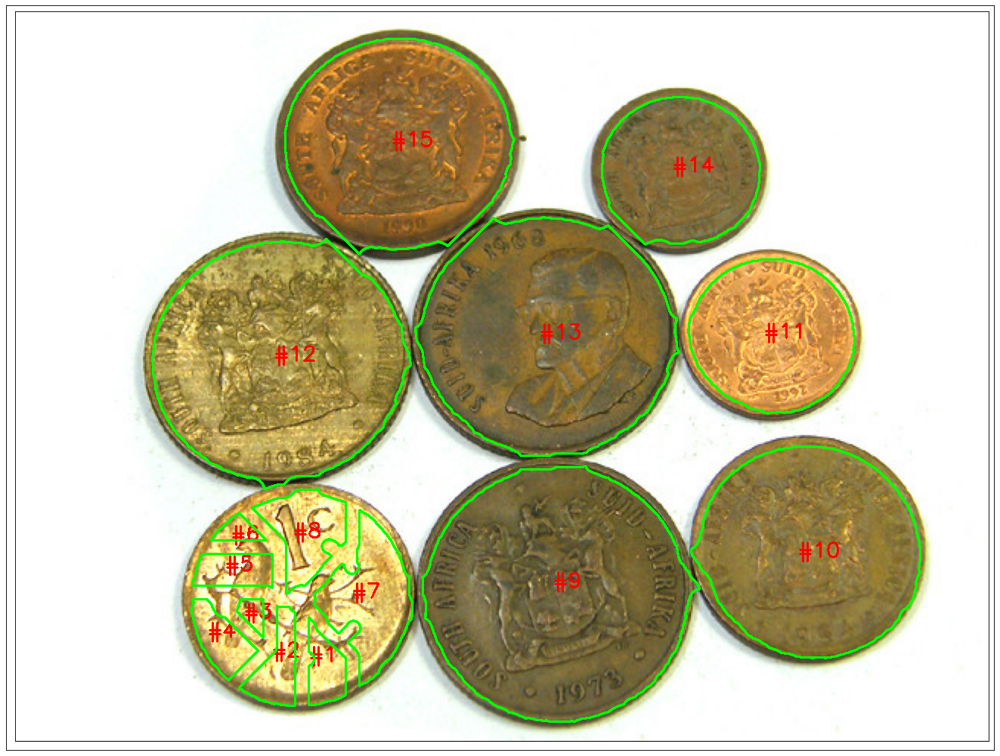

In [46]:
# Результат после морфологической фильтрации и выделения контуров
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    thresh = cv2.threshold(np.uint8(image_mask * 255), 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    print(thresh[1])
    cnts = cv2.findContours(thresh[1], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    image_to_show = cv2.cvtColor(image, cv2.COLOR_HSV2BGR)
    for (i, c) in enumerate(cnts):
        # draw the contour
        ((x, y), _) = cv2.minEnclosingCircle(c)
        cv2.putText(image_to_show, "#{}".format(i + 1), (int(x) - 10, int(y)),
            cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)
        cv2.drawContours(image_to_show, [c], -1, (0, 255, 0), 2)
    plt.imshow(cv2.cvtColor(image_to_show, cv2.COLOR_BGR2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

Прим.:Для более правильного разделения надо подобрать такие значения disk, что изображение не дробится так сильно, но тк одна итерация занимает >10 минут, я бросил это занятие.


### Листинг 3. Сегментация изображения по водоразделам



In [19]:
# Исходное изображение
image = cv2.imread("things.png")

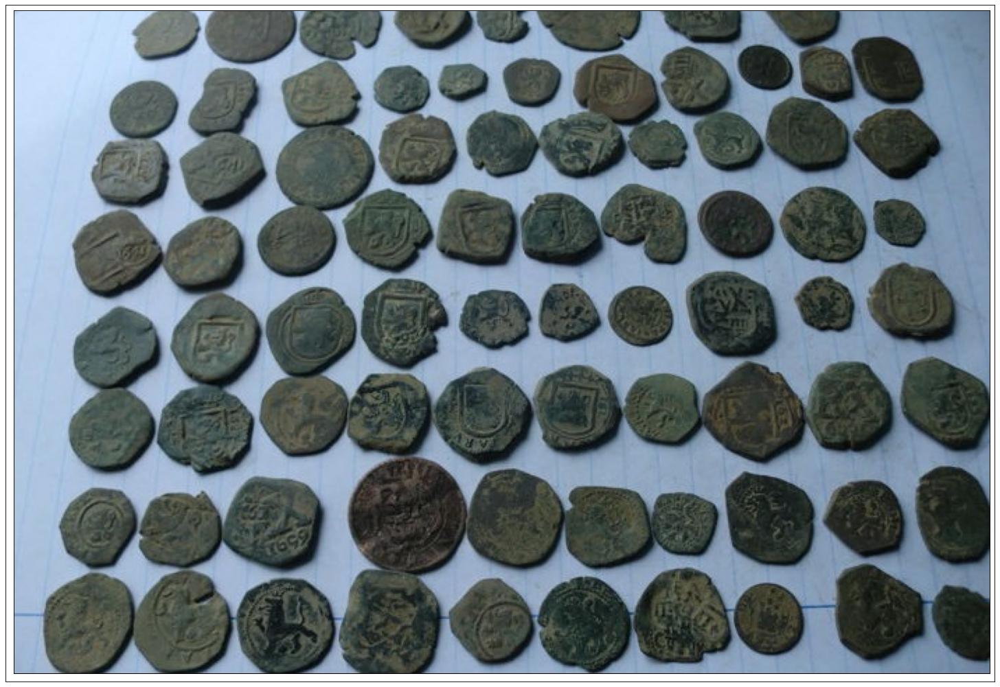

In [20]:
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

In [21]:
# Перевод в пространство HSV
image = cv2.cvtColor(np.float32(image / 255.0), cv2.COLOR_BGR2HSV)

# Создание маски для цвета яблок
image_mask = image[:,:,2] < 0.6

# Открытие (отмыкание, размыкание, раскрытие): (𝐴 ⊖ 𝐵) ⊕ 𝐵
selem = skimage.morphology.disk(11)
image_mask = skimage.morphology.erosion(image_mask, selem)
image_mask = skimage.morphology.dilation(image_mask, selem)

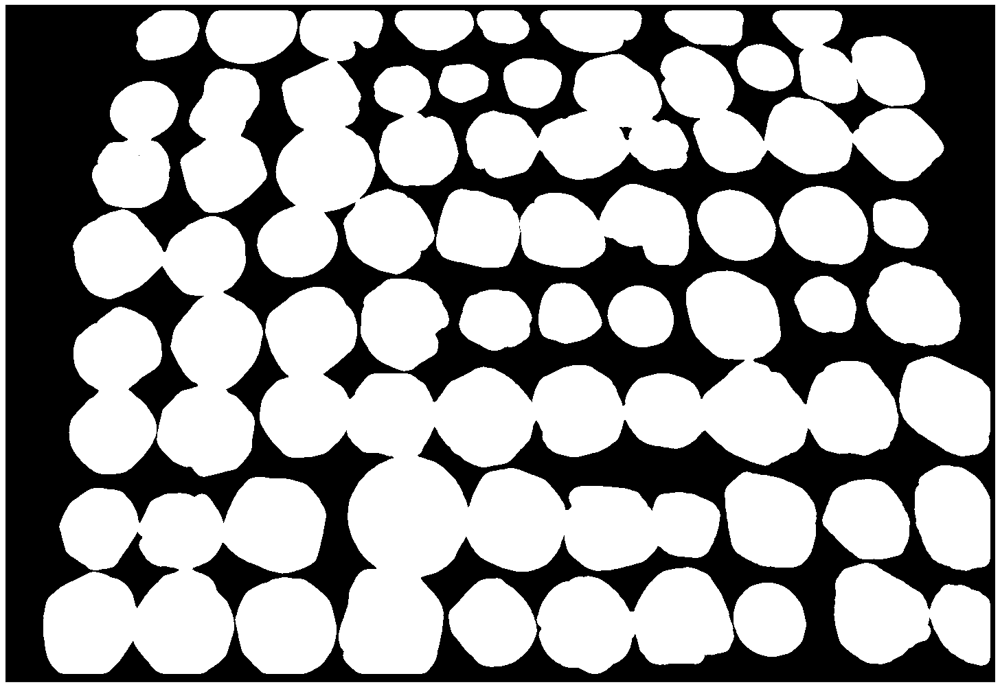

In [22]:
# Вид маски после морфологической фильтрации, но до сегментации водоразделом
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    plt.imshow(cv2.cvtColor(np.uint8(image_mask * 255), cv2.COLOR_GRAY2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

In [23]:
# Составление рельефа
D = scipy.ndimage.distance_transform_edt(image_mask * 1)

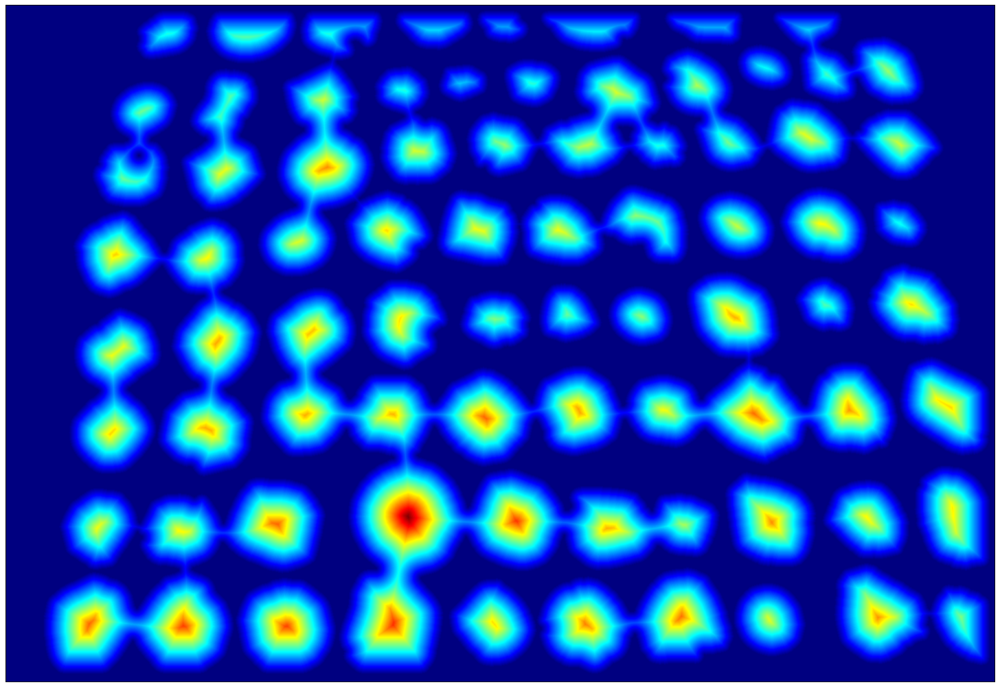

In [24]:
# *Глубина* впадины, куда будет стекать вода
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    D_heat = np.float32(D / np.max(D))
    heat = cv2.applyColorMap(np.uint8(D_heat * 255), cv2.COLORMAP_JET)
    plt.imshow(cv2.cvtColor(heat, cv2.COLOR_BGR2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()

In [25]:
# Выбор локальных минимумов рельефа
localMax = skimage.feature.peak_local_max(D, indices=False, min_distance=15, labels=image_mask)
markers = scipy.ndimage.label(localMax, structure=np.ones((3, 3)))[0]

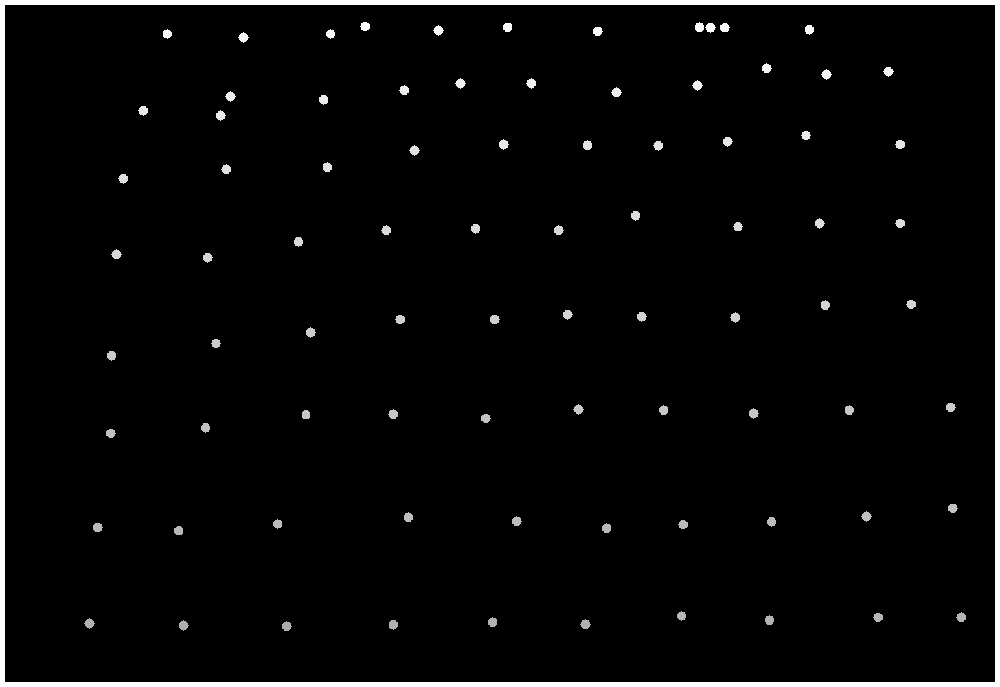

In [26]:
# Локальные минимумы рельефа в виде точек
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    image_to_show = markers
    selem = skimage.morphology.disk(7)
    image_to_show = skimage.morphology.dilation(image_to_show, selem)
    image_to_show = cv2.cvtColor(np.uint8(image_to_show * 255), cv2.COLOR_GRAY2RGB)
    plt.imshow(image_to_show)
    plt.xticks([]),plt.yticks([])
    plt.show()

In [27]:
# Выполнение сегментации водоразделом
labels = skimage.segmentation.watershed(-D, markers, mask=image_mask)


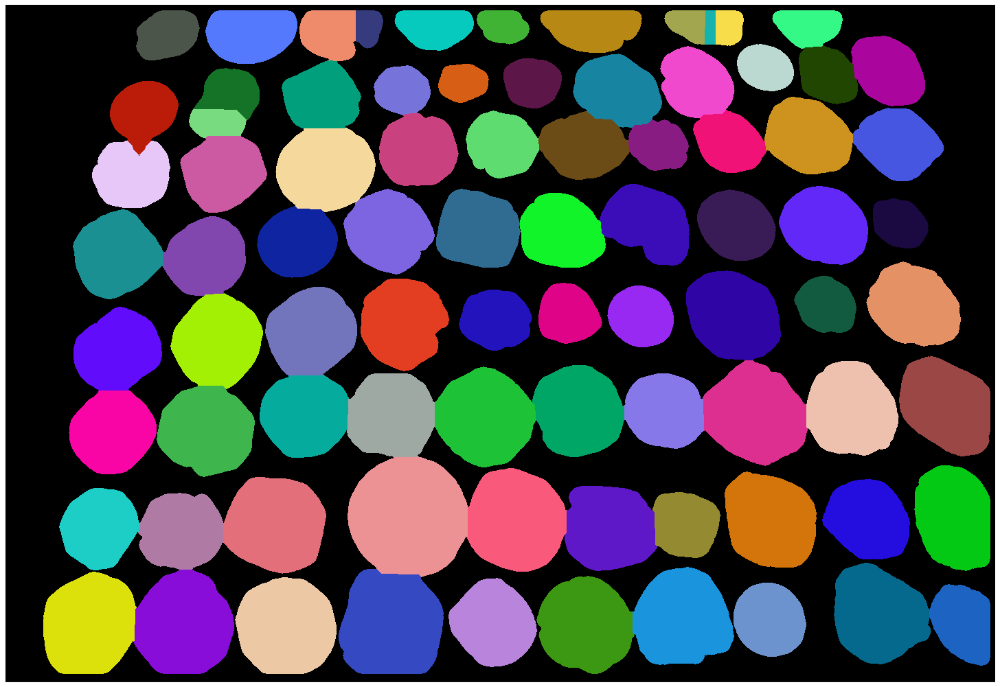

In [28]:
# Результат сегментации водоразделом
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    labels_colored = np.zeros_like(labels, dtype=np.uint8)
    labels_colored = cv2.cvtColor(labels_colored, cv2.COLOR_GRAY2RGB)
    for label in np.unique(labels):
        if label == 0:
            continue
        labels_colored[labels == label] = np.uint8(np.round((np.random.rand(3) * 255)))
    plt.imshow(labels_colored)
    plt.xticks([]),plt.yticks([])
    plt.show()

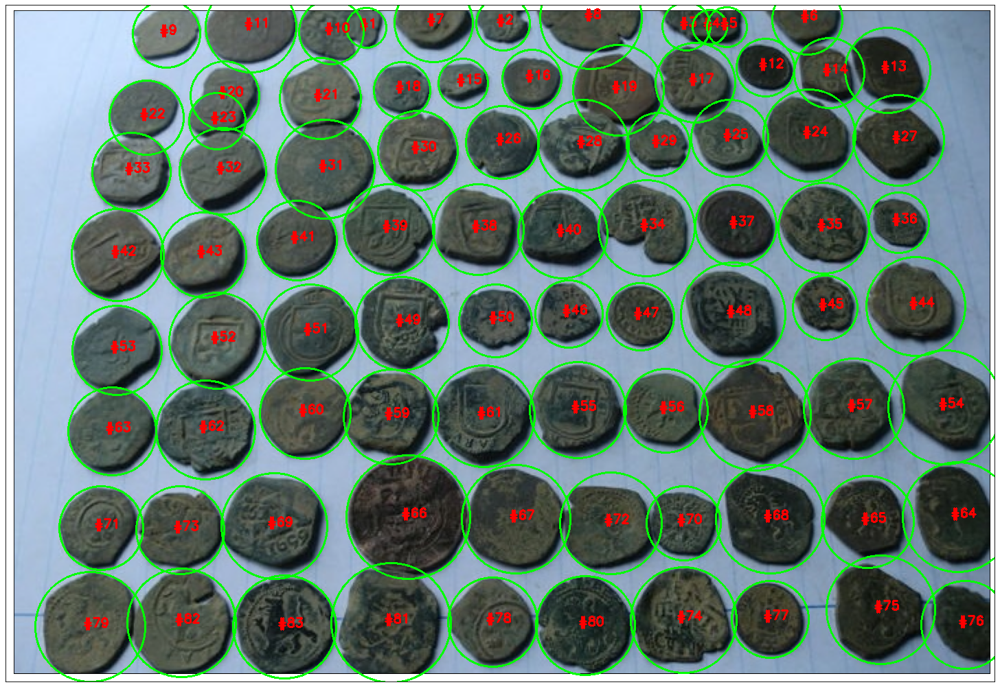

label_count = 83


In [29]:
# Результат после сегментации водоразделом и выделения контуров
if use_graph:
    figure(figsize=(32, 16), dpi=80)
    image_to_show = cv2.cvtColor(image, cv2.COLOR_HSV2BGR)
    label_count = 0
    for label in np.unique(labels):
        if label == 0:
            continue
        mask = np.zeros(image_mask.shape, dtype="uint8")
        mask[labels == label] = 255
        cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = imutils.grab_contours(cnts)
        c = max(cnts, key=cv2.contourArea)
        ((x, y), r) = cv2.minEnclosingCircle(c)
        cv2.circle(image_to_show, (int(x), int(y)), int(r), (0, 255, 0), 2)
        cv2.putText(image_to_show, "#{}".format(label), (int(x) - 10, int(y)),
            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)
        label_count = label
    plt.imshow(cv2.cvtColor(image_to_show, cv2.COLOR_BGR2RGB))
    plt.xticks([]),plt.yticks([])
    plt.show()
    print(f"label_count = {label_count}")